In [42]:
# Import necessary packages

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import sklearn
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

from sklearn.linear_model import RidgeCV, LinearRegression, ElasticNetCV
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor

from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

import warnings
warnings.filterwarnings('ignore')

import lime
from lime import lime_tabular

import shap

### Load the Datasets

In [43]:
# Load The Datasets
df_dev = pd.read_csv("data/dev.csv").drop(columns = ['position', 'element'])
df_test = pd.read_csv("data/test.csv").drop(columns = ['position', 'element'])

print("Dataset Shapes \n")
print("- Development Set: {}".format(df_dev.shape))
print("- Test Set: {}".format(df_test.shape))

# Split into features
X_dev, y_dev = df_dev.drop(columns=["total_points"]), df_dev["total_points"]
X_test, y_test = df_test.drop(columns=["total_points"]), df_test["total_points"]

y_dev = np.reshape(y_dev.values, (-1, 1))
y_test = np.reshape(y_test.values, (-1, 1))

yscaler = StandardScaler()
y_dev = yscaler.fit_transform(y_dev)
y_test = yscaler.transform(y_test)

Dataset Shapes 

- Development Set: (77930, 26)
- Test Set: (19483, 26)


### Linear Regression

In [44]:
pipe = make_pipeline(StandardScaler(), PCA(), LinearRegression())

param_grid = {'pca__n_components': [0.8, 0.95]}
search = GridSearchCV(pipe, param_grid)

search.fit(X_dev, y_dev)

print("Best Parameters: {}".format(search.best_params_))
print("MSE (unscaled data): {}".format(mean_squared_error(yscaler.inverse_transform(y_test), yscaler.inverse_transform(search.predict(X_test)))))


Best Parameters: {'pca__n_components': 0.95}
MSE (unscaled data): 5.263544618313292


### Load the Datasets that don't have outliers

In [45]:
# Load The Datasets without outliers
df_dev = pd.read_csv("data/dev_v2.csv").drop(columns = ['position', 'element'])
df_test = pd.read_csv("data/test_v2.csv").drop(columns = ['position', 'element'])

print("Dataset Shapes \n")
print("- Development Set: {}".format(df_dev.shape))
print("- Test Set: {}".format(df_test.shape))

# Split into features
X_dev, y_dev = df_dev.drop(columns=["total_points"]), df_dev["total_points"]
X_test, y_test = df_test.drop(columns=["total_points"]), df_test["total_points"]

y_dev = np.reshape(y_dev.values, (-1, 1))
y_test = np.reshape(y_test.values, (-1, 1))

yscaler = StandardScaler()
y_dev = yscaler.fit_transform(y_dev)
y_test = yscaler.transform(y_test)

Dataset Shapes 

- Development Set: (72899, 26)
- Test Set: (18225, 26)


### Linear Regression on the dataset without outliers

In [46]:
pipe = make_pipeline(StandardScaler(), PCA(), LinearRegression())

param_grid = {'pca__n_components': [0.8, 0.95]}
search = GridSearchCV(pipe, param_grid)

search.fit(X_dev, y_dev)

print("Best Parameters: {}".format(search.best_params_))
print("MSE (unscaled data): {}".format(mean_squared_error(yscaler.inverse_transform(y_test), yscaler.inverse_transform(search.predict(X_test)))))


Best Parameters: {'pca__n_components': 0.95}
MSE (unscaled data): 1.7599558854006914


<b>Note:</b> Observe that after removing the outliers from the initial dataset, the MSE value drops from 5.23 to 1.76 on unscaled data. This is a huge gain in performance as this essentially goes on to show that the predictions for total points are now in the vicinity of 1.32 of the actual points on average as compared to 2.29 points earlier.

### Elastic Net CV

In [47]:
pipe_en = make_pipeline(StandardScaler(), PCA(), ElasticNetCV())

param_grid = {'pca__n_components': [0.8, 0.95],
              'elasticnetcv__l1_ratio': [0.3, 0.5, 0.7]}
search_en = GridSearchCV(pipe_en, param_grid)
search_en.fit(X_dev, y_dev)

print("Best Parameters: {}".format(search_en.best_params_))
print("MSE (unscaled data): {}".format(mean_squared_error(yscaler.inverse_transform(y_test), yscaler.inverse_transform(search_en.predict(X_test).reshape((-1, 1))))))


Best Parameters: {'elasticnetcv__l1_ratio': 0.7, 'pca__n_components': 0.95}
MSE (unscaled data): 1.7598823475531786


### Decision Tree Regressor

In [48]:
pipe_dt = make_pipeline(StandardScaler(), PCA(0.95), DecisionTreeRegressor())

param_grid = {'decisiontreeregressor__max_depth': [8, 10, 15]}
search_dt = GridSearchCV(pipe_dt, param_grid)
search_dt.fit(X_dev, y_dev)

print("Best Parameters: {}".format(search_dt.best_params_))
print("MSE (unscaled data): {}".format(mean_squared_error(yscaler.inverse_transform(y_test), yscaler.inverse_transform(search_dt.predict(X_test).reshape((-1, 1))))))


Best Parameters: {'decisiontreeregressor__max_depth': 8}
MSE (unscaled data): 1.7891526349516143


#### Model Interpretability

##### Using LIME to understand some predictions

In [49]:
explainer = lime_tabular.LimeTabularExplainer(X_dev.values,
                                              feature_names = X_dev.columns.values,
                                              class_names = ['total_points'],
                                              mode = 'regression')

In [50]:
i = 80
print("Prediction: ", search_dt.predict(X_test.loc[i, :].values.reshape((1, -1)))[0])
print("Actual:     ", y_test.flatten()[i])

exp = explainer.explain_instance(X_test.loc[i, :].values, search_dt.predict)
exp.show_in_notebook(show_table = True)

Prediction:  0.5280793783958948
Actual:      0.6487893577997523


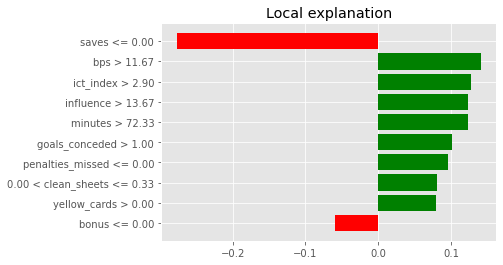

In [51]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

<b>Note:</b> The above plot shows how the 80th sample was predicted and what all features were crucial in making the prediction. We see that the features - minutes, red_cards, bps, ict_index, and penalties_saved, in this order, positively influenced the decision of the model, while the others in the above plot influence the decision negatively. This analysis helps in understanding the prediction process, highlights the features used, and improves the local interpretability of the model.

In [52]:
i = 1230
print("Prediction: ", search_dt.predict(X_test.loc[i, :].values.reshape((1, -1)))[0])
print("Actual:     ", y_test.flatten()[i])

exp = explainer.explain_instance(X_test.loc[i, :].values, search_dt.predict)
exp.show_in_notebook(show_table = True)

Prediction:  -0.3922246539066316
Actual:      0.6487893577997523


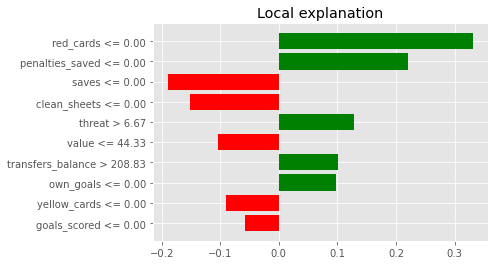

In [53]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

<b>Note:</b> The above plot shows how the 1230th sample was predicted and what all features were crucial in making the prediction. We see that features like red_cards, own_goals, threat, and transfers_balance, in this order, positively influenced the decision of the model. This sample, according to me, is a misprediction as the predicted value and the actual value differ quite a bit. The above plot makes it clear why that is the case. The model is influenced differently for some features which leads to the misprediction. 

##### Using SHAP to understand global behaviour

In [54]:
search_dt.best_params_

{'decisiontreeregressor__max_depth': 8}

In [55]:
# refitting the best model
model = DecisionTreeRegressor(max_depth = search_dt.best_params_['decisiontreeregressor__max_depth'])
preprocess_shap = make_pipeline(StandardScaler(), PCA(0.95))

In [56]:
X_dev_shap = preprocess_shap[1].fit_transform(preprocess_shap[0].fit_transform(X_dev))
X_test_shap = preprocess_shap[1].transform(preprocess_shap[0].transform(X_test))

model.fit(X_dev_shap, y_dev)

DecisionTreeRegressor(max_depth=8)

In [57]:
shap.initjs()
explainer = shap.Explainer(model)
shap_values = explainer(X_test_shap)

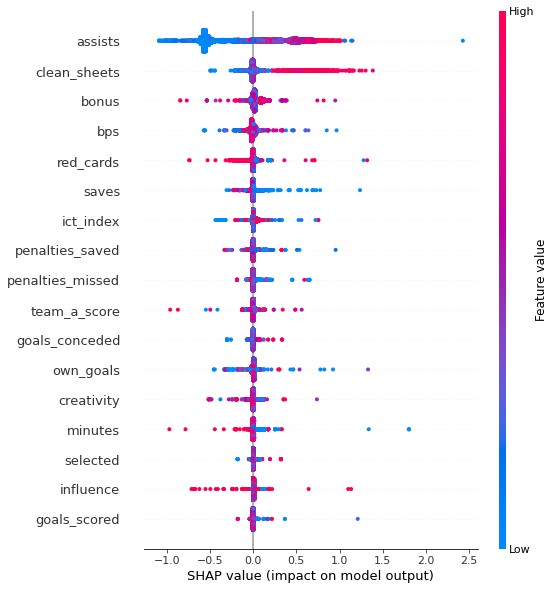

In [58]:
shap.summary_plot(shap_values, X_test_shap, feature_names=X_dev.columns)

Observe how different features impact the model output. This plot essentially explains how deviations in the the feature values affects the model output. The feature assists seems to be the most volatile, in the sense that, perturbations in this feature value affects the model output significantly. On the other hand, the feature saves or goals_scored don't really have an impact on the decision making process of the model. 

### Random Forest Regressor

In [59]:
pipe_rf = make_pipeline(StandardScaler(),
                        PCA(0.95),
                        RandomForestRegressor(n_estimators=50, max_depth=8))

search_rf = pipe_rf
search_rf.fit(X_dev, y_dev)

print("MSE (unscaled data): {}".format(mean_squared_error(yscaler.inverse_transform(y_test), yscaler.inverse_transform(search_rf.predict(X_test).reshape((-1, 1))))))


MSE (unscaled data): 1.7256296572794363


#### Model Interpretability

##### Using LIME to understand some predictions

In [60]:
explainer = lime_tabular.LimeTabularExplainer(X_dev.values,
                                              feature_names = X_dev.columns.values,
                                              class_names = ['total_points'],
                                              mode = 'regression')

In [61]:
i = 80
print("Prediction: ", search_rf.predict(X_test.loc[i, :].values.reshape((1, -1)))[0])
print("Actual:     ", y_test.flatten()[i])

exp = explainer.explain_instance(X_test.loc[i, :].values, search_rf.predict)
exp.show_in_notebook(show_table = True)

Prediction:  0.5544388819149195
Actual:      0.6487893577997523


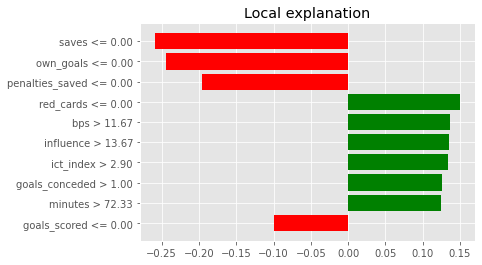

In [62]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

<b>Note:</b> The above plot shows how the 80th sample was predicted and what all features were crucial in making the prediction using the Random Forest Regressor. We see that the features - minutes, bps, and red cards, in this order, positively influenced the decision of the model, while the others in the above plot influence the decision negatively. This analysis helps in understanding the prediction process, highlights the features used, and improves the local interpretability of the model.

In [63]:
i = 1230
print("Prediction: ", search_rf.predict(X_test.loc[i, :].values.reshape((1, -1)))[0])
print("Actual:     ", y_test.flatten()[i])

exp = explainer.explain_instance(X_test.loc[i, :].values, search_rf.predict)
exp.show_in_notebook(show_table = True)

Prediction:  -0.0687541127610267
Actual:      0.6487893577997523


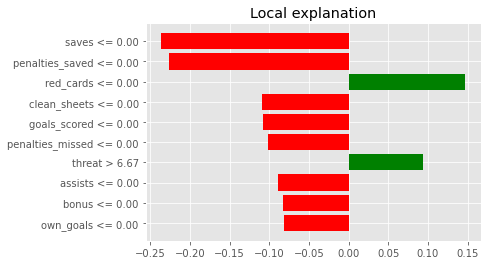

In [64]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

<b>Note:</b> The above plot shows how the 1230th sample was predicted and what all features were crucial in making the prediction. This analysis shows how different decisions affect the model output. For instance, 20.67 < minutes <= 72.33 positively influences the prediction. The maximum effect is due to the penalties saved. These explain very well how each prediction is made, and useful in understanding which features are relevant. 

##### Using SHAP to understand global behaviour

In [65]:
model = pipe_rf[2]

In [66]:
X_dev_shap = pipe_rf[1].fit_transform(pipe_rf[0].fit_transform(X_dev))
X_test_shap = pipe_rf[1].transform(pipe_rf[0].transform(X_test))

model.fit(X_dev_shap, y_dev)

RandomForestRegressor(max_depth=8, n_estimators=50)

In [67]:
shap.initjs()
explainer = shap.Explainer(model)
shap_values = explainer(X_test_shap)

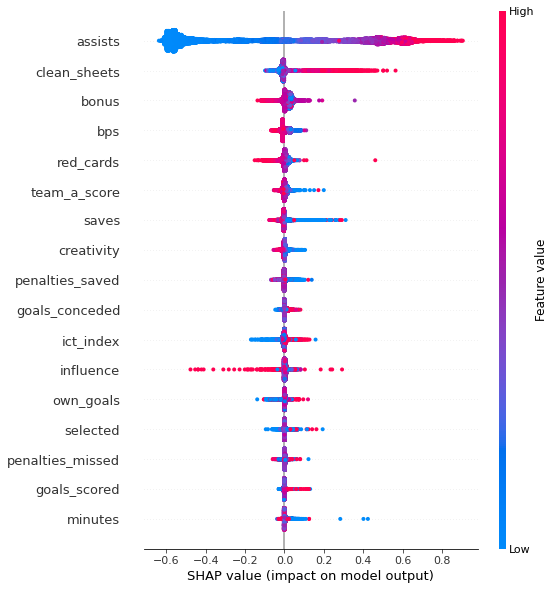

In [68]:
shap.summary_plot(shap_values, X_test_shap, feature_names=X_dev.columns)

Observe how different features impact the model output. This plot essentially explains how deviations in the the feature values affects the model output. The feature assists seems to be the most volatile, in the sense that, perturbations in this feature value affects the model output significantly. On the other hand, the feature saves doesnt even show up. Then there are other features like penalties missed whose impact on the model output is not that huge. This gives us a sense of which features are being focused on while making a decision using the random forest regressor. 

### XGBoost Regressor

In [69]:
pipe_xgb = make_pipeline(StandardScaler(),
                        PCA(0.95),
                        XGBRegressor(n_estimators=55, max_depth=5))

search_xgb = pipe_xgb
search_xgb.fit(X_dev, y_dev)

print("MSE (unscaled data): {}".format(mean_squared_error(yscaler.inverse_transform(y_test), yscaler.inverse_transform(search_xgb.predict(X_test).reshape((-1, 1))))))


MSE (unscaled data): 1.7411911593055511


#### Model Interpretability

##### Using LIME to understand some predictions

In [70]:
explainer = lime_tabular.LimeTabularExplainer(X_dev.values,
                                              feature_names = X_dev.columns.values,
                                              class_names = ['total_points'],
                                              mode = 'regression')

In [71]:
i = 80
print("Prediction: ", search_xgb.predict(X_test.loc[i, :].values.reshape((1, -1)))[0])
print("Actual:     ", y_test.flatten()[i])

exp = explainer.explain_instance(X_test.loc[i, :].values, search_xgb.predict)
exp.show_in_notebook(show_table = True)

Prediction:  0.23327947
Actual:      0.6487893577997523


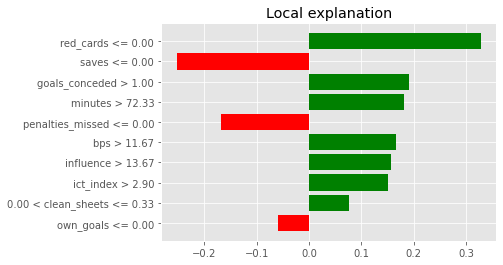

In [72]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

<b>Note:</b> The above plot shows how the 80th sample was predicted and what all features were crucial in making the prediction using the XGBoost Regressor. It highlights the decision making proccess. For instance, playing 72.33 minutes or more positively influences the number of points that player could score. On the other hand, if the number of penalties the player could save are less than 0 then it reduces the number of points on average. 

In [73]:
i = 1230
print("Prediction: ", search_xgb.predict(X_test.loc[i, :].values.reshape((1, -1)))[0])
print("Actual:     ", y_test.flatten()[i])

exp = explainer.explain_instance(X_test.loc[i, :].values, search_xgb.predict)
exp.show_in_notebook(show_table = True)

Prediction:  -0.009004798
Actual:      0.6487893577997523


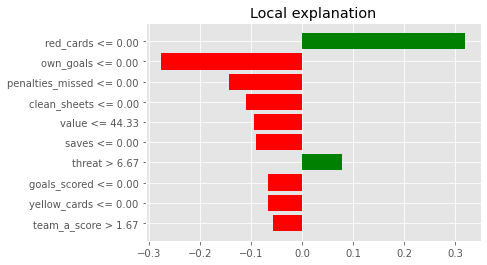

In [74]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

<b>Note:</b> The above plot shows how the 1230th sample was predicted and what all features were crucial in making the prediction. This analysis shows how different decisions affect the model output. For instance, if a player got no red cards in the last 3 weeks, then the chances of him scoring higher points in the coming week are higher. On the other hand, not saving a penalty negatively affects the average number of points of that player. 

##### Using SHAP to understand global behaviour

In [75]:
model = pipe_xgb[2]

In [76]:
X_dev_shap = pipe_xgb[1].fit_transform(pipe_xgb[0].fit_transform(X_dev))
X_test_shap = pipe_xgb[1].transform(pipe_xgb[0].transform(X_test))

model.fit(X_dev_shap, y_dev)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=55, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [77]:
shap.initjs()
explainer = shap.Explainer(model)
shap_values = explainer(X_test_shap)

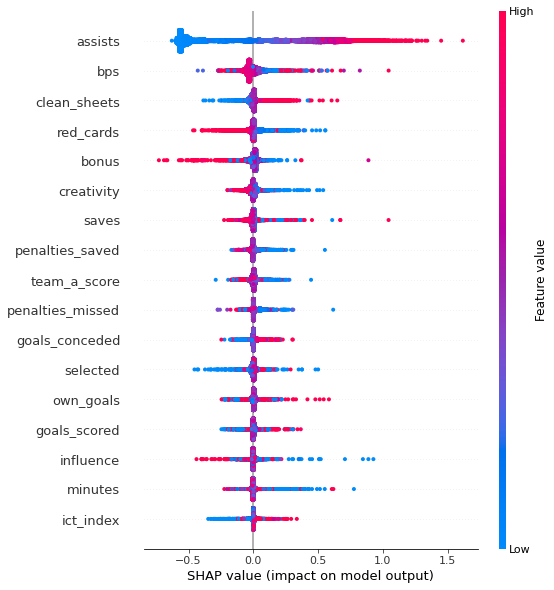

In [101]:
shap.summary_plot(shap_values, X_test_shap, feature_names=X_dev.columns)

Observe how different features impact the model output. This plot essentially explains how deviations in the the feature values affects the model output.

### Neural Networks

In [111]:
from keras.models import Sequential
from keras.layers import Dense
import keras

In [106]:
model = Sequential()
model.add(Dense(128, input_dim = X_dev.shape[1], activation = 'tanh'))
model.add(Dense(64, activation = 'tanh'))
model.add(Dense(1, activation = 'linear'))

In [107]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 128)               3328      
                                                                 
 dense_4 (Dense)             (None, 64)                8256      
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 11,649
Trainable params: 11,649
Non-trainable params: 0
_________________________________________________________________


In [114]:
!pip3 install pydot

In [115]:
keras.utils.vis_utils.plot_model(model, show_shapes = True, show_layer_names = True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [117]:
pipe_nn = make_pipeline(StandardScaler(), PCA(), model)
pipe_nn[2].compile(optimizer = 'SGD', loss = 'mse')

In [118]:
num_epochs = 25
pipe_nn.fit(X_dev, y_dev, sequential__batch_size = 32, sequential__epochs = num_epochs, sequential__validation_split = 0.2)

Epoch 1/25
1823/1823 [==============================] - 3s 1ms/step - loss: 0.7227 - val_loss: 0.7615
Epoch 2/25
1823/1823 [==============================] - 3s 1ms/step - loss: 0.7132 - val_loss: 0.7503
Epoch 3/25
1823/1823 [==============================] - 3s 1ms/step - loss: 0.7106 - val_loss: 0.7498
Epoch 4/25
1823/1823 [==============================] - 3s 1ms/step - loss: 0.7097 - val_loss: 0.7475
Epoch 5/25
1823/1823 [==============================] - 3s 1ms/step - loss: 0.7080 - val_loss: 0.7607
Epoch 6/25
1823/1823 [==============================] - 3s 1ms/step - loss: 0.7074 - val_loss: 0.7534
Epoch 7/25
1823/1823 [==============================] - 3s 1ms/step - loss: 0.7065 - val_loss: 0.7501
Epoch 8/25
1823/1823 [==============================] - 3s 1ms/step - loss: 0.7056 - val_loss: 0.7497
Epoch 9/25
1823/1823 [==============================] - 3s 1ms/step - loss: 0.7051 - val_loss: 0.7496
Epoch 10/25
1823/1823 [==============================] - 3s 1ms/step - loss: 0.704

Pipeline(steps=[('standardscaler', StandardScaler()), ('pca', PCA()),
                ('sequential',
                 <keras.engine.sequential.Sequential object at 0x7f82850928e0>)])

Text(0, 0.5, 'MSE on scaled data')

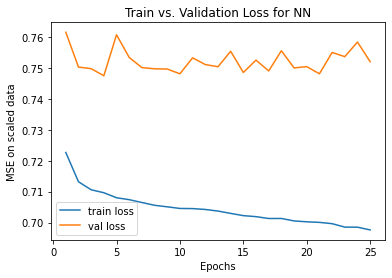

In [119]:
plt.plot(range(1, num_epochs + 1), pipe_nn[2].history.history['loss'], label = 'train loss')
plt.plot(range(1, num_epochs + 1), pipe_nn[2].history.history['val_loss'], label = 'val loss')
plt.legend()
plt.title('Train vs. Validation Loss for NN')
plt.xlabel('Epochs')
plt.ylabel('MSE on scaled data')

In [120]:
mean_squared_error(yscaler.inverse_transform(y_test), yscaler.inverse_transform(pipe_nn.predict(X_test)))

570/570 [==============================] - 1s 964us/step


1.729920868156107